In [6]:
import numpy as np
import os
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
import re

In [34]:
def calculate_score(
    file_path,
    n,
    show_plots=True,
    save_dir=None,
    bins=50,
    kde=True,
    image_path=None,      # ← 추가: 이번 iter에 대응되는 이미지 경로
    image_title=None      # ← 타이틀(없으면 파일명)
):
    with open(file_path, 'r', encoding='utf-8') as f:
        lines = f.readlines()
    try:
        last_line = lines[n+1].strip()
        second_last_line = lines[n].strip()
    except Exception:
        print("done")
        return False

    def parse_line(line):
        parts = line.split(',')
        vals = []
        for val in parts:
            v = val.strip()
            if v.startswith('+'):
                v = v[1:]
            try:
                vals.append(float(v))
            except ValueError:
                continue
        return np.asarray(vals, dtype=float)

    values_last = parse_line(last_line)
    values_second_last = parse_line(second_last_line)
    if values_last.size == 0 or values_second_last.size == 0:
        raise ValueError("데이터를 읽지 못했습니다.")

    # ---- 3σ filter ----
    def filter_3sigma(values):
        m = np.mean(values)
        s = np.std(values, ddof=0)
        lower, upper = m - 3*s, m + 3*s
        return values[(values >= lower) & (values <= upper)], (m, s, (lower, upper))

    filtered_last, stats_last = filter_3sigma(values_last)
    filtered_second_last, stats_second = filter_3sigma(values_second_last)
    if filtered_last.size == 0 or filtered_second_last.size == 0:
        raise ValueError("3σ 이내 값이 없습니다.")

    avg_last  = float(np.mean(filtered_last))
    avg_second_last = float(np.mean(filtered_second_last))
    score =  avg_second_last - avg_last

    # ---- helpers ----
    def gaussian_kde(x, grid):
        if x.size < 2:
            return np.zeros_like(grid)
        s = np.std(x, ddof=1)
        if s == 0:
            mu = np.mean(x)
            return np.exp(-0.5*((grid-mu)/1e-6)**2)/(np.sqrt(2*np.pi)*1e-6)
        h = 1.06 * s * (x.size ** (-1/5))
        h = max(h, 1e-6)
        u = (grid[:, None] - x[None, :]) / h
        kern = np.exp(-0.5 * u**2) / (np.sqrt(2*np.pi) * h)
        return np.mean(kern, axis=1)

    def load_gray_array(path: Path):
        """PIL로 읽어 '그레이스케일 ndarray'와 적절한 vmax 반환"""
        im = Image.open(path)
        # 이미 L(8bit) 또는 I;16(16bit)면 그대로, 아니면 흑백 변환
        if im.mode not in ("L", "I;16"):
            im = im.convert("L")
        arr = np.array(im)
        # dtype에 맞춰 vmin/vmax 고정 (자동 정규화 방지)
        if arr.dtype == np.uint8:
            vmin, vmax = 0, 255
        elif arr.dtype == np.uint16:
            vmin, vmax = 0, 65535
        else:
            # 그 외는 robust 범위
            lo, hi = np.percentile(arr, [0.5, 99.5])
            vmin, vmax = float(lo), float(hi)
        return arr, vmin, vmax

    # ---- figure: [이미지 | 히스토그램 | 히스토그램] ----
    fig, axes = plt.subplots(
        1, 3, figsize=(18, 5),
        gridspec_kw={"width_ratios": [1.2, 1, 1]}
    )

    # (0) 이미지
    if image_path is not None:
        arr, vmin, vmax = load_gray_array(Path(image_path))
        axes[0].imshow(arr, cmap="gray", vmin=vmin, vmax=vmax)
        axes[0].set_title(image_title or Path(image_path).name, fontsize=10)
        axes[0].axis("off")
    else:
        axes[0].axis("off")
        axes[0].set_title("No image")

        # (1)(2) 히스토그램: raw 분포 기준(평균/±3σ도 raw 기준)
    for ax, data, stats, title in zip(
        axes[1:],   # 위치는 그대로 두되
        [values_second_last, values_last],   # 순서 바꿈
        [stats_second, stats_last],          # 순서 바꿈
        [ "line profiles perpendicular to walls (3 sigma)","line profiles parallel to walls (3 sigma)"]
    ):
        mean, std, (lo, up) = stats
        ax.hist(data, bins=bins, alpha=0.6, density=True, edgecolor="black")

        if kde and data.size >= 2:
            gmin, gmax = np.min(data), np.max(data)
            pad = 0.1 * (gmax - gmin + 1e-12)
            grid = np.linspace(gmin - pad, gmax + pad, 600)
            dens = gaussian_kde(data, grid)
            ax.plot(grid, dens, linewidth=2)

        ax.axvline(lo, linestyle="--", linewidth=2, label="-3σ")
        ax.axvline(up, linestyle="--", linewidth=2, label="+3σ")
        ax.axvline(mean, linestyle="-", linewidth=2, label="Mean")

        ax.set_title(title)
        ax.set_xlabel("Value")
        ax.set_ylabel("Density")
        ax.legend(loc="best")


    plt.tight_layout()
    if save_dir:
        os.makedirs(save_dir, exist_ok=True)
        fig.savefig(os.path.join(save_dir, f"n{n}_image_and_hists.png"), dpi=150, bbox_inches="tight")
    if show_plots:
        plt.show()
    else:
        plt.close(fig)

    extras = {
        "filtered_last_size": int(filtered_last.size),
        "filtered_second_last_size": int(filtered_second_last.size),
        "filtered_last_mean": avg_last,
        "filtered_second_last_mean": avg_second_last,
    }
    return score, avg_last, avg_second_last, extras


In [8]:
# ▼ INTENSITY 이미지 폴더
img_dir = Path(r"images")
exts = {".png", ".jpg", ".jpeg", ".bmp", ".tif", ".tiff"}

# "_0000000003_IMG_INTENSITY..." 또는 "_0000000003_INTENSITY..." 모두 매칭
seq_pat = re.compile(r"_(\d{6,})_(?:IMG_)?INTENSITY", re.IGNORECASE)

img_pairs = []
unmatched = []

# 하위 폴더까지 모두 탐색
for p in img_dir.rglob("*"):
    if p.is_file() and p.suffix.lower() in exts and "intensity" in p.name.lower():
        m = seq_pat.search(p.name)  # 확장자 포함 이름에서 검색해도 OK
        if m:
            img_pairs.append((int(m.group(1)), p))
        else:
            unmatched.append(p.name)

if not img_pairs:
    raise RuntimeError("INTENSITY 이미지에서 시퀀스 번호를 찾지 못했습니다. (정규식/경로 확인)")

# 디버그: 매칭 안 된 파일 이름 확인
if unmatched:
    print("[참고] 시퀀스 번호를 못 찾은 파일들:", unmatched[:10], "...")

# 시퀀스 번호 기준 정렬 및 iter 매핑 (가장 작은 번호 → iter 1)
img_pairs.sort(key=lambda t: t[0])
base_seq = img_pairs[0][0]
iter2path = {seq - base_seq + 1: path for (seq, path) in img_pairs}
max_iter = max(iter2path)

print(f"INTENSITY 이미지 {len(img_pairs)}개, 첫 시퀀스 {base_seq}, 마지막 iter {max_iter}")
# 앞 몇 개 확인
for k in range(1, min(5, max_iter) + 1):
    print(f"iter {k} -> {iter2path[k].name}")


INTENSITY 이미지 30개, 첫 시퀀스 47, 마지막 iter 30
iter 1 -> 250907_205441_0000000047_IMG_INTENSITY_OK.png
iter 2 -> 250907_210347_0000000048_IMG_INTENSITY_OK.png
iter 3 -> 250907_211135_0000000049_IMG_INTENSITY_OK.png
iter 4 -> 250907_212711_0000000050_IMG_INTENSITY_OK.png
iter 5 -> 250907_213400_0000000051_IMG_INTENSITY_OK.png


In [35]:
def show_iter_overlay(
    file_path:str,
    iter2path:dict,          # {iter:int -> 이미지 Path}
    target_iter:int,
    num_iters:int, # None이면 파일 전체 사용
    grid_points:int=600,
):
    """
    왼쪽: target_iter 이미지
    오른쪽: (parallel, perpendicular) KDE를 모든 iter에 대해 겹치기. target_iter는 빨간색
    파일의 첫 줄부터 2줄씩 (parallel, perpendicular) 한 쌍으로 끝까지 처리.
    """
    # 1) 파일 읽기
    with open(file_path, 'r', encoding='utf-8') as f:
        lines = f.readlines()

    # 2) 각 iter의 원시 데이터 수집 (0~끝까지 전부)
    vals_last_all = []    # perpendicular (두 번째 줄)
    vals_second_all = []  # parallel      (첫 번째 줄)
    i = 0
    while i + 1 < len(lines):
        v_second = _parse_line(lines[i].strip())
        v_last   = _parse_line(lines[i+1].strip())
        # 둘 다 유효할 때만 추가
        if v_second.size > 0 and v_last.size > 0:
            vals_second_all.append(v_second)
            vals_last_all.append(v_last)
        i += 2

    # 3) 필요시 개수 제한 (num_iters가 지정되면 앞에서부터 자름)
    if num_iters is not None:
        vals_second_all = vals_second_all[:num_iters]
        vals_last_all   = vals_last_all[:num_iters]

    actual_iters = len(vals_last_all)
    if actual_iters == 0:
        raise ValueError("유효한 (parallel, perpendicular) 데이터 쌍을 찾지 못했습니다.")
    if target_iter < 1 or target_iter > actual_iters:
        raise ValueError(f"target_iter는 1~{actual_iters} 사이여야 합니다.")

    # 4) 선택된 iter의 3σ 평균/점수 출력
    idx = target_iter - 1
    
    avg_par = _score_3sigma(vals_last_all[idx])
    avg_perp = _score_3sigma(vals_second_all[idx])
    score    =  avg_perp - avg_par
    print(
        f"iter {target_iter} : score : {round(score, 3)} "
        f"(perpendicular profile mean : {round(avg_perp, 3)}, "
        f"parallel profile mean : {round(avg_par, 3)})",
        flush=True
    )

    # 5) 공통 그리드 (각 축별 전체 범위)
    def make_grid(all_arrays):
        xmin = min(float(a.min()) for a in all_arrays if a.size > 0)
        xmax = max(float(a.max()) for a in all_arrays if a.size > 0)
        pad  = 0.1 * (xmax - xmin + 1e-12)
        return np.linspace(xmin - pad, xmax + pad, grid_points)

    grid_last   = make_grid(vals_last_all)
    grid_second = make_grid(vals_second_all)

    # 6) 그림: [이미지 | KDE(parallel) | KDE(perpendicular)]
    fig, axes = plt.subplots(1, 3, figsize=(18, 5), gridspec_kw={"width_ratios": [1.2, 1, 1]})

    # (왼쪽) 이미지
    img_path = iter2path.get(target_iter, None)
    if img_path is not None:
        arr, vmin, vmax = _load_gray(Path(img_path))
        axes[0].imshow(arr, cmap="gray", vmin=vmin, vmax=vmax)
        axes[0].set_title(f"Iteration {target_iter} — {Path(img_path).name}", fontsize=10)
        axes[0].axis("off")
    else:
        axes[0].axis("off"); axes[0].set_title(f"Iteration {target_iter} (no image)")

    # (오른쪽) KDE 겹치기 함수
    def plot_overlay(ax, all_arrays, grid, title):
        for j, arr in enumerate(all_arrays, start=1):
            y = _gaussian_kde(arr, grid)
            if j == target_iter:
                ax.plot(grid, y, color="red", linewidth=2.5, label=f"iter {j}")
            else:
                ax.plot(grid, y, color="orange", alpha=0.6, linewidth=1.5)
        ax.set_title(title)
        ax.set_xlabel("Value")
        ax.set_ylabel("Density")
        ax.legend(loc="best")

    # 🔁 위치 + 타이틀: parallel 먼저, perpendicular 다음
    plot_overlay(axes[1], vals_second_all, grid_second, "perpendicular KDE (all)")
    plot_overlay(axes[2], vals_last_all,   grid_last,   "parallel KDE (all)")

    plt.tight_layout()
    plt.show()


iter 1 : score : 16.504 (perpendicular profile mean : 35.698, parallel profile mean : 19.193)


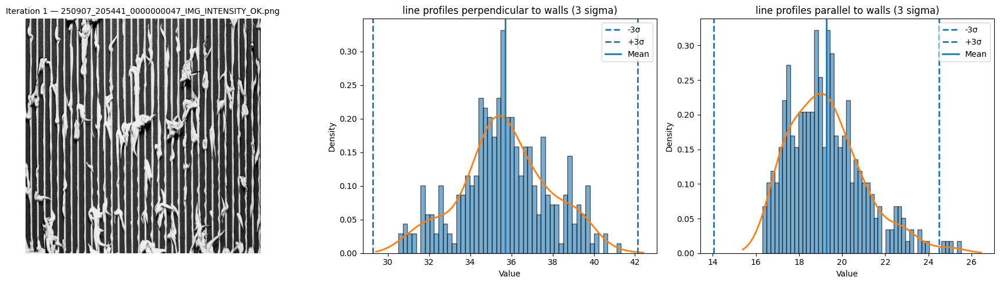

iter 2 : score : 17.732 (perpendicular profile mean : 38.497, parallel profile mean : 20.765)


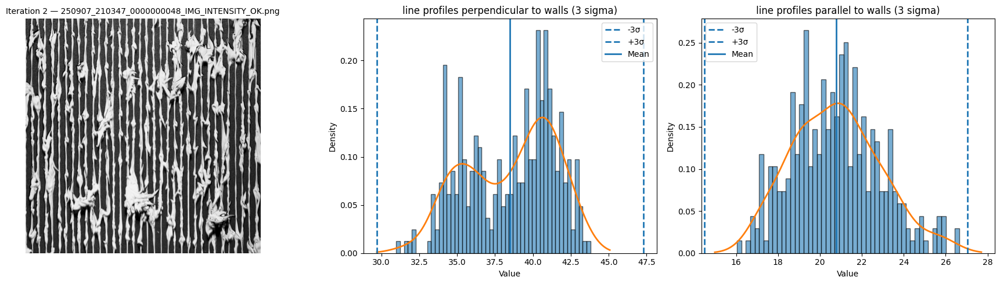

iter 3 : score : 26.544 (perpendicular profile mean : 42.929, parallel profile mean : 16.385)


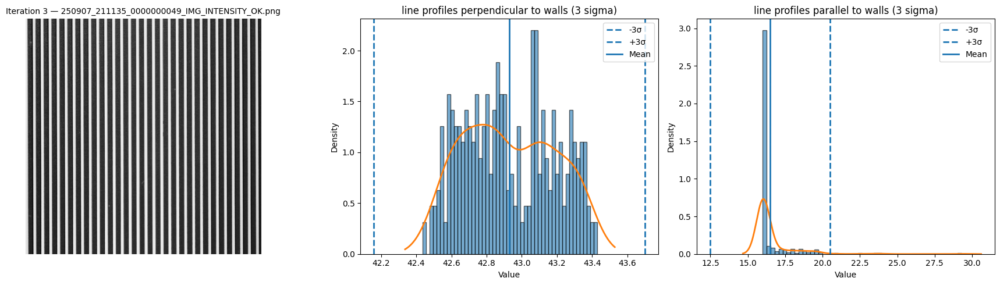

iter 4 : score : 3.066 (perpendicular profile mean : 21.313, parallel profile mean : 18.247)


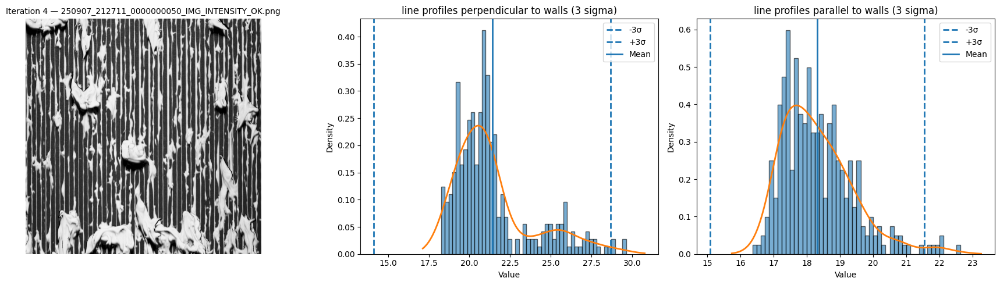

iter 5 : score : 27.772 (perpendicular profile mean : 45.698, parallel profile mean : 17.926)


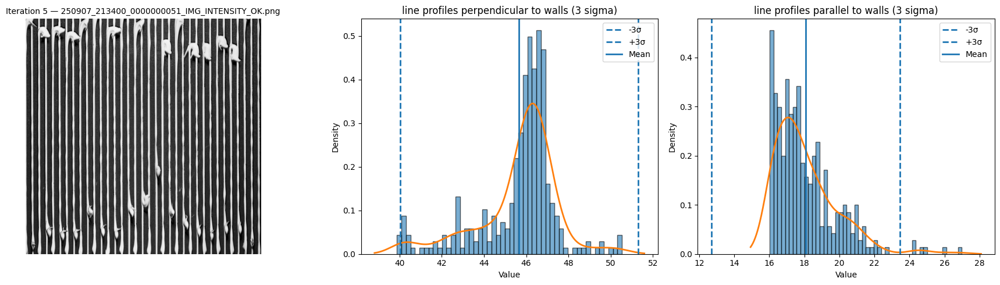

iter 6 : score : 0.209 (perpendicular profile mean : 16.371, parallel profile mean : 16.162)


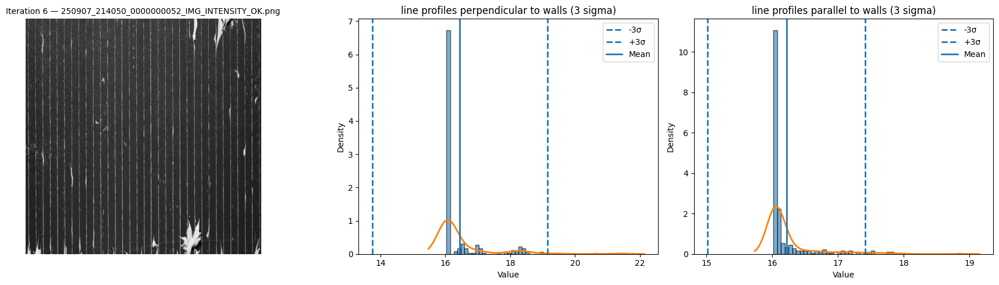

iter 7 : score : 31.703 (perpendicular profile mean : 48.232, parallel profile mean : 16.529)


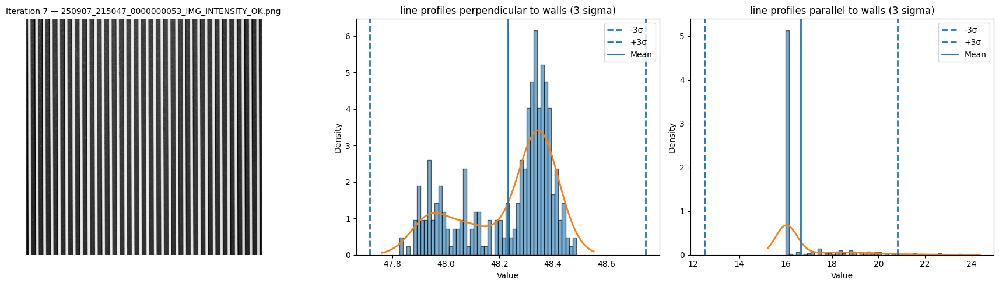

iter 8 : score : 32.819 (perpendicular profile mean : 49.348, parallel profile mean : 16.529)


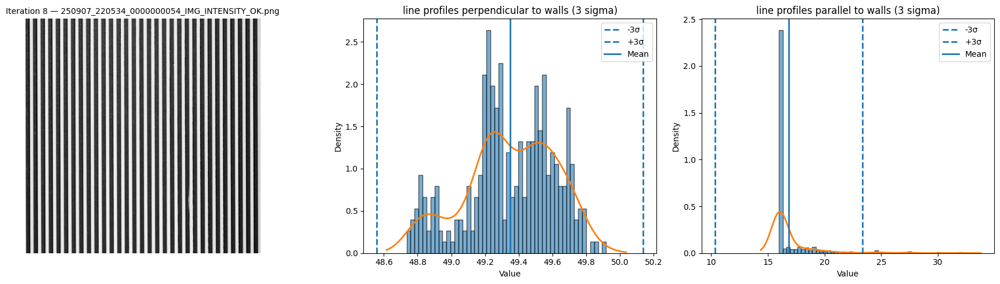

iter 9 : score : 44.216 (perpendicular profile mean : 61.488, parallel profile mean : 17.272)


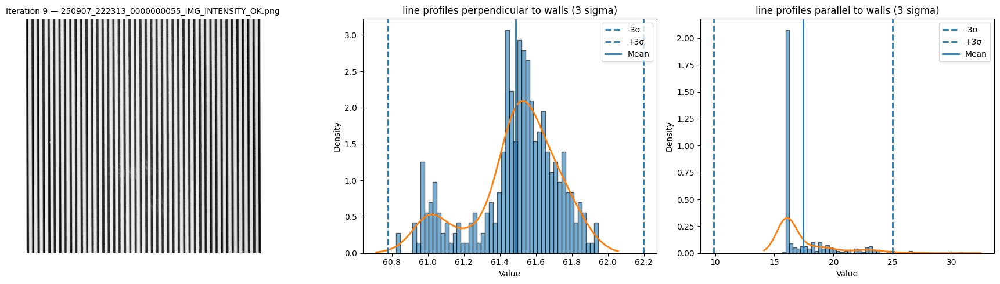

iter 10 : score : 0.181 (perpendicular profile mean : 16.188, parallel profile mean : 16.007)


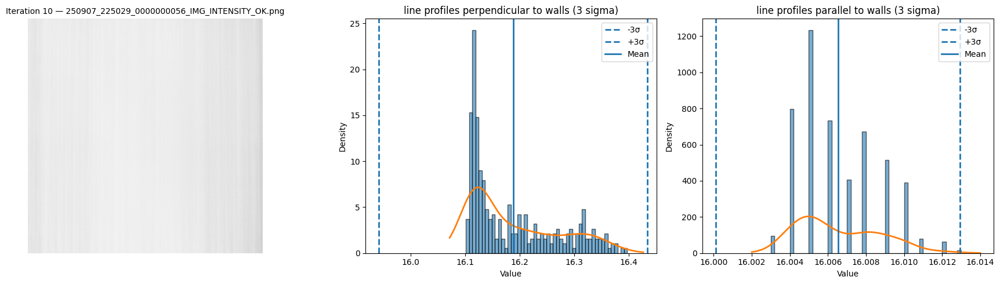

iter 11 : score : 42.907 (perpendicular profile mean : 59.911, parallel profile mean : 17.004)


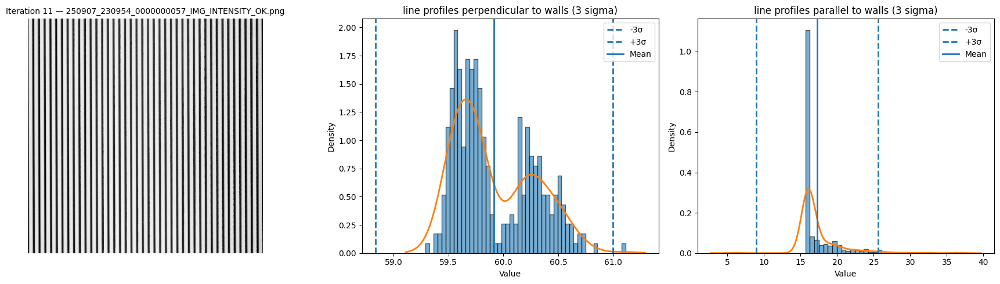

iter 12 : score : 38.875 (perpendicular profile mean : 55.794, parallel profile mean : 16.92)


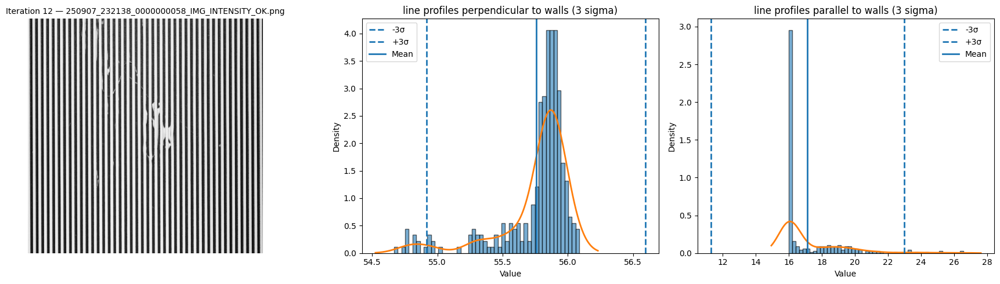

iter 13 : score : 39.019 (perpendicular profile mean : 56.2, parallel profile mean : 17.181)


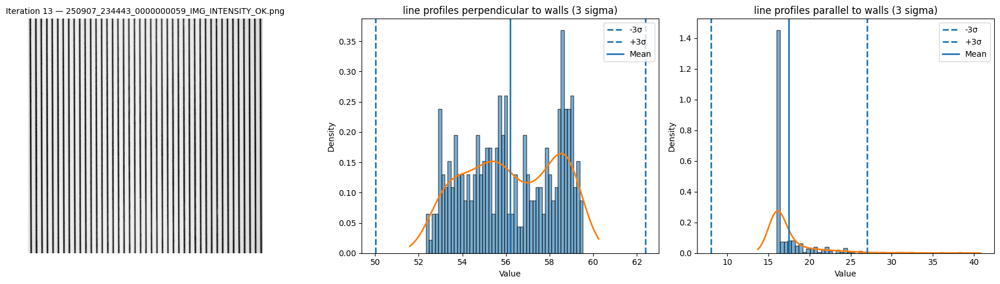

iter 14 : score : 24.486 (perpendicular profile mean : 41.661, parallel profile mean : 17.175)


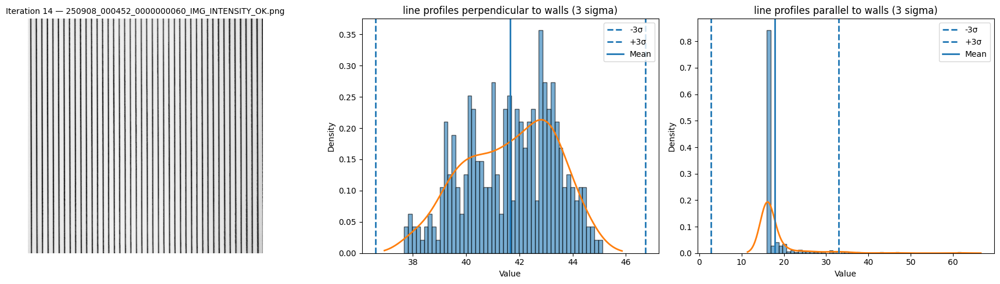

iter 15 : score : 35.817 (perpendicular profile mean : 52.469, parallel profile mean : 16.652)


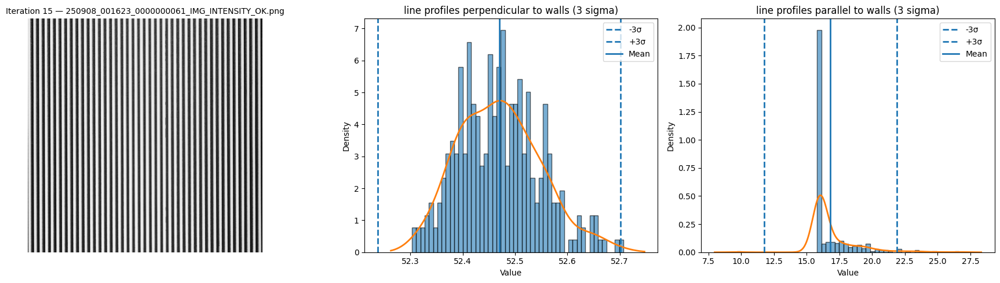

iter 16 : score : 39.723 (perpendicular profile mean : 56.612, parallel profile mean : 16.889)


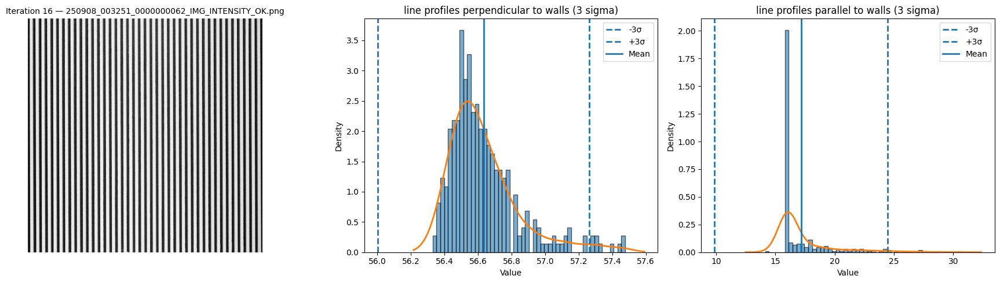

iter 17 : score : 45.213 (perpendicular profile mean : 62.565, parallel profile mean : 17.352)


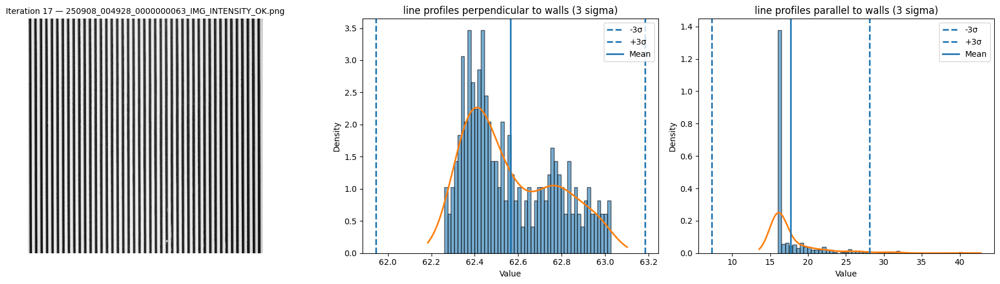

iter 18 : score : 45.458 (perpendicular profile mean : 62.47, parallel profile mean : 17.012)


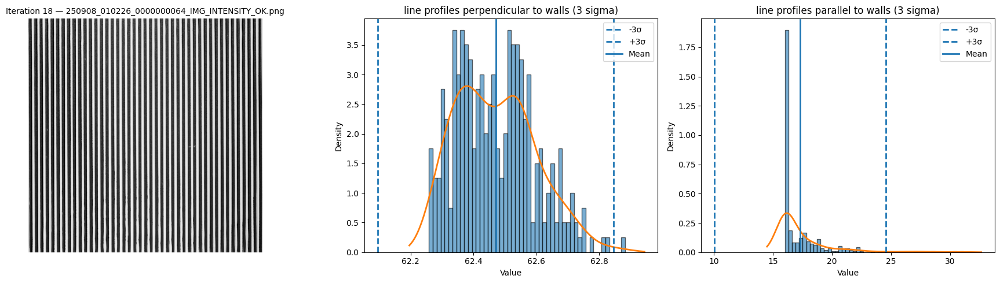

iter 19 : score : 33.749 (perpendicular profile mean : 54.397, parallel profile mean : 20.648)


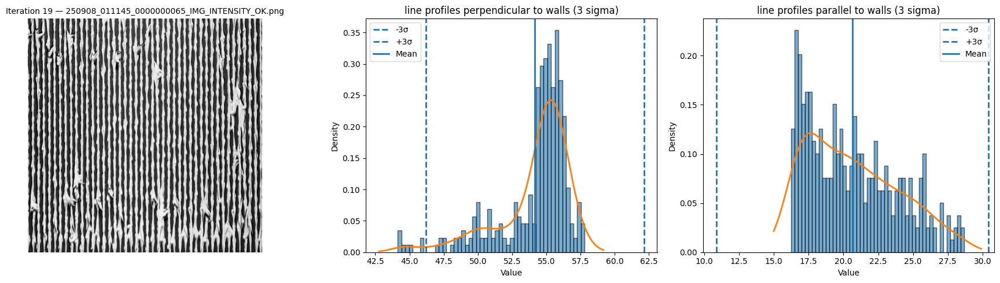

iter 20 : score : 45.649 (perpendicular profile mean : 62.851, parallel profile mean : 17.202)


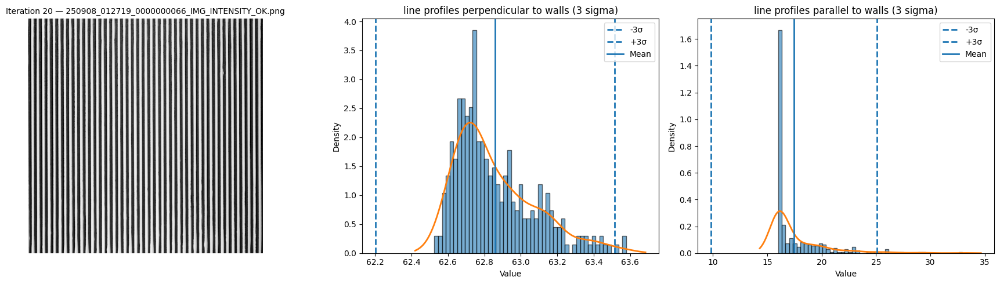

iter 21 : score : 49.332 (perpendicular profile mean : 67.077, parallel profile mean : 17.745)


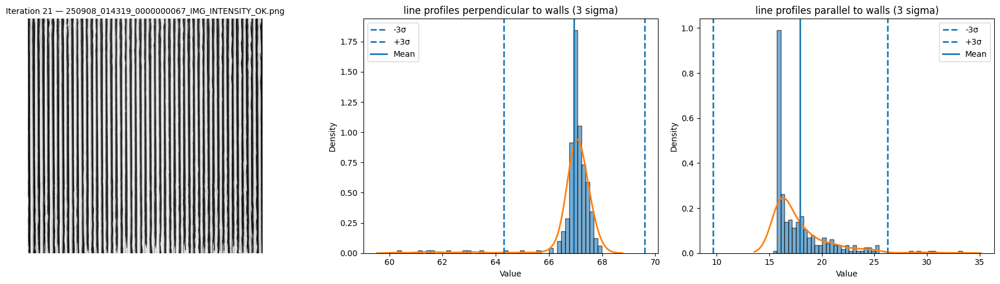

iter 22 : score : 45.077 (perpendicular profile mean : 63.67, parallel profile mean : 18.593)


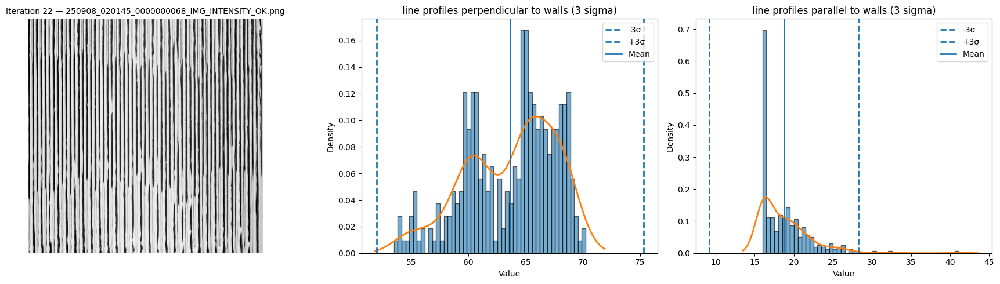

iter 23 : score : 18.278 (perpendicular profile mean : 40.268, parallel profile mean : 21.99)


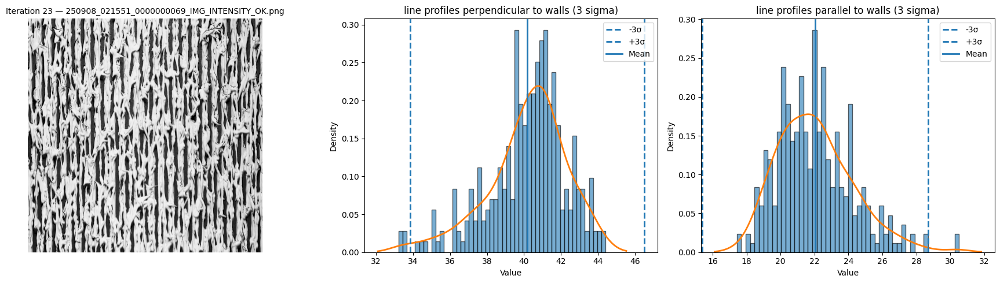

iter 24 : score : 42.133 (perpendicular profile mean : 59.85, parallel profile mean : 17.717)


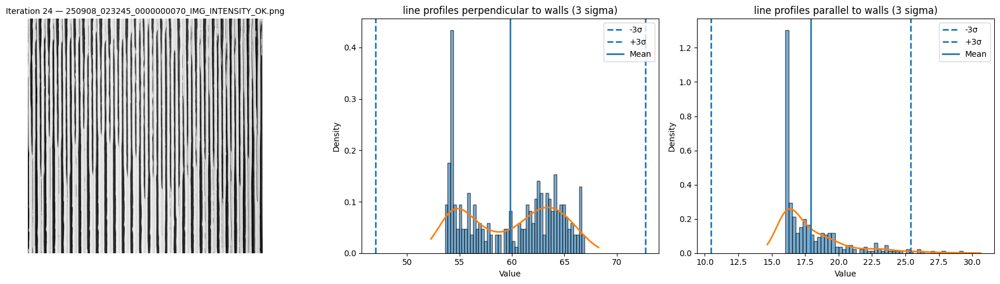

iter 25 : score : 48.878 (perpendicular profile mean : 66.445, parallel profile mean : 17.567)


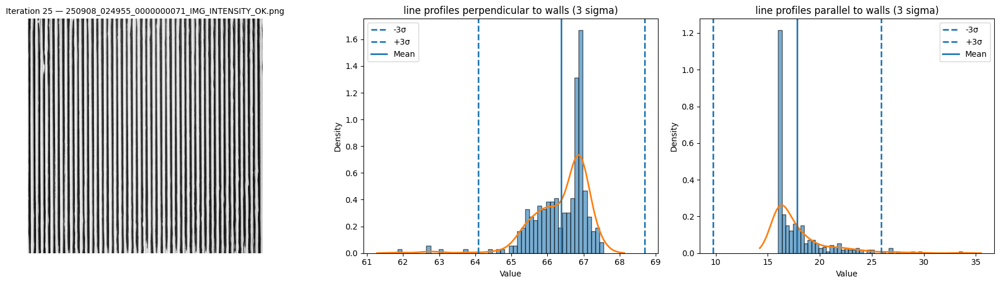

iter 26 : score : 44.872 (perpendicular profile mean : 62.774, parallel profile mean : 17.902)


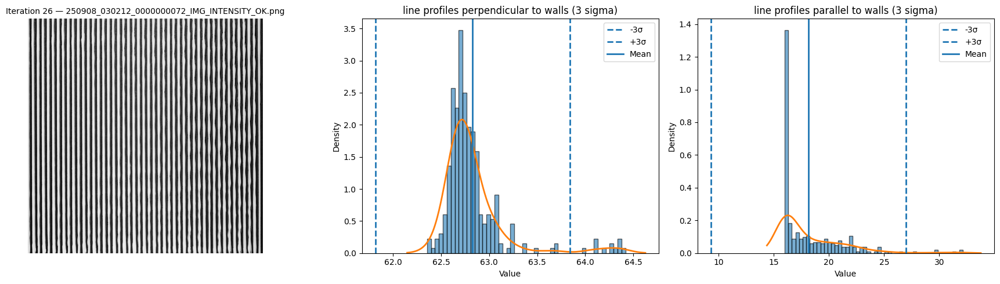

iter 27 : score : 49.772 (perpendicular profile mean : 67.423, parallel profile mean : 17.651)


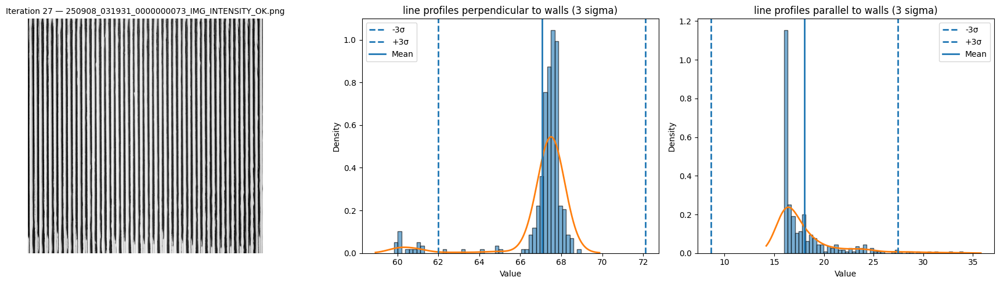

iter 28 : score : 40.452 (perpendicular profile mean : 59.332, parallel profile mean : 18.88)


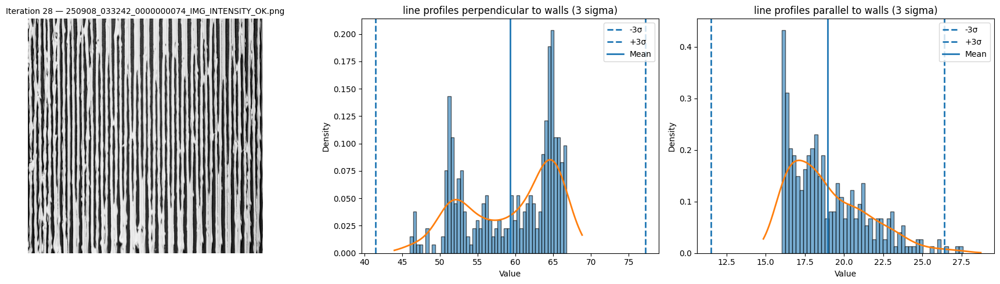

iter 29 : score : 44.228 (perpendicular profile mean : 61.962, parallel profile mean : 17.734)


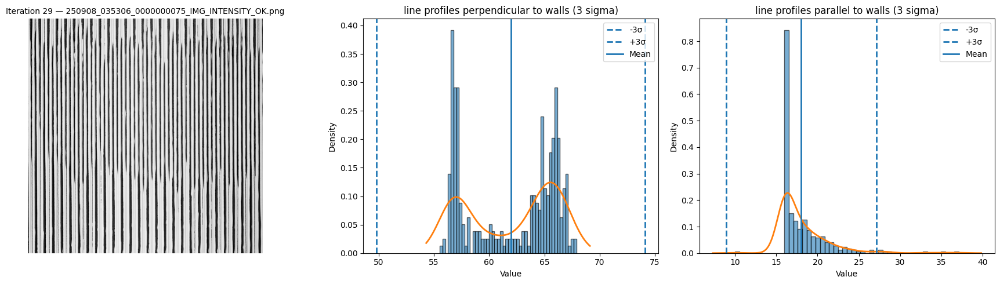

iter 30 : score : 30.384 (perpendicular profile mean : 49.154, parallel profile mean : 18.77)


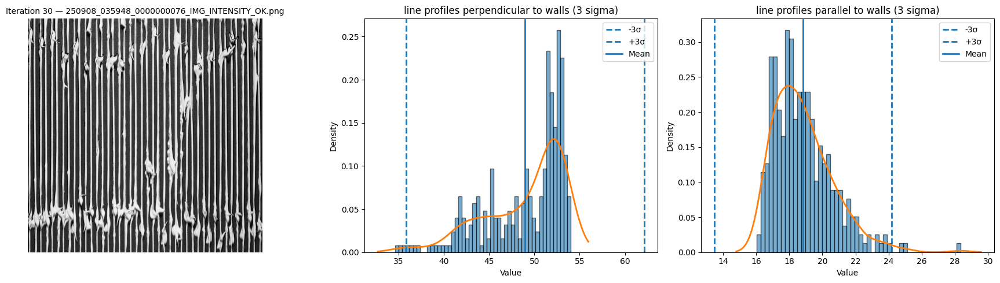

done
done


In [36]:
file = r"250829_104449_last60.txt"

boStart = False
count = 0
iter = 1
first_iter_score = 16.504

while True:
    # 1) 먼저 계산만 (출력/그림 없음)
    res = calculate_score(file, count, show_plots=False)
    if res is False:
        print("done")
        break
    score, avg_last, avg_second_last, extras = res

    # 2) 트리거 체크 (이번 쌍에서 켜짐)
    if not boStart:
        boStart = True

    # 3) 시작 이후엔: print 먼저, 그 다음 같은 iter/count로 그림 렌더
    if boStart:
        
            #print("-"*138)
            #print("-"*138)
        
        print(
            f"iter {iter} : score : {round(score, 3)} "
            f"(perpendicular profile mean : {round(avg_second_last, 3)}, "
            f"parallel profile mean : {round(avg_last, 3)})",
            flush=True
        )
        
        

        img_path = iter2path.get(iter)  # 시퀀스→iter 매핑 딕셔너리 (앞서 만든 것)
        calculate_score(
            file, count,
            show_plots=True,                 # 여기서만 그림 출력
            image_path=img_path,
            image_title=f"Iteration {iter} — {img_path.name}" if img_path else None
        )

        iter += 1

    # 4) 다음 줄 쌍으로 이동
    count += 2


iter 1 : score : 16.504 (perpendicular profile mean : 35.698, parallel profile mean : 19.193)


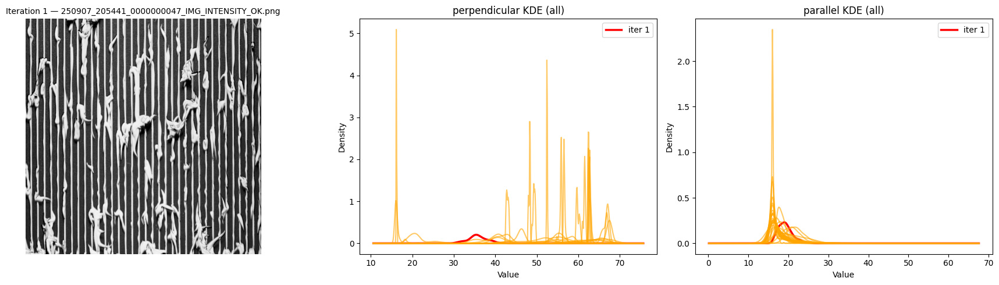

iter 2 : score : 17.732 (perpendicular profile mean : 38.497, parallel profile mean : 20.765)


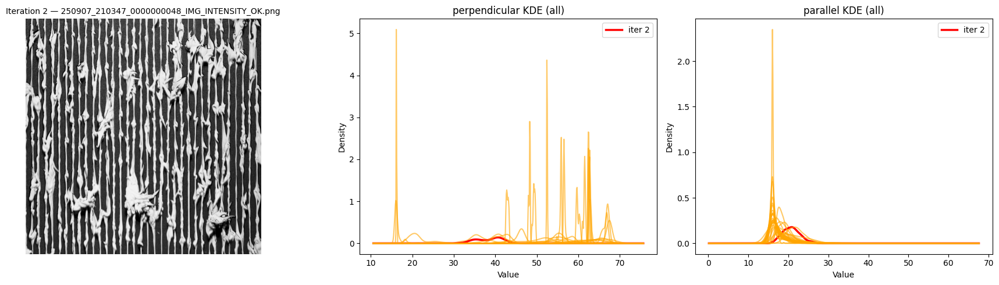

iter 3 : score : 26.544 (perpendicular profile mean : 42.929, parallel profile mean : 16.385)


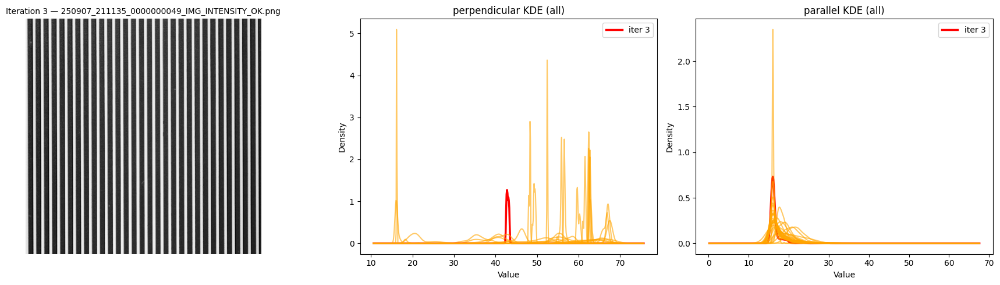

iter 4 : score : 3.066 (perpendicular profile mean : 21.313, parallel profile mean : 18.247)


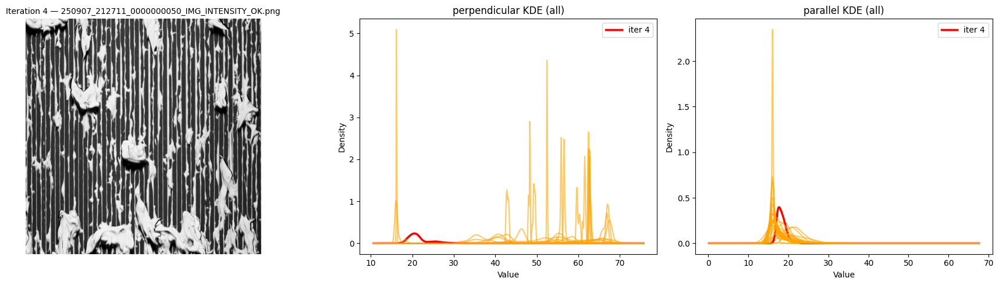

iter 5 : score : 27.772 (perpendicular profile mean : 45.698, parallel profile mean : 17.926)


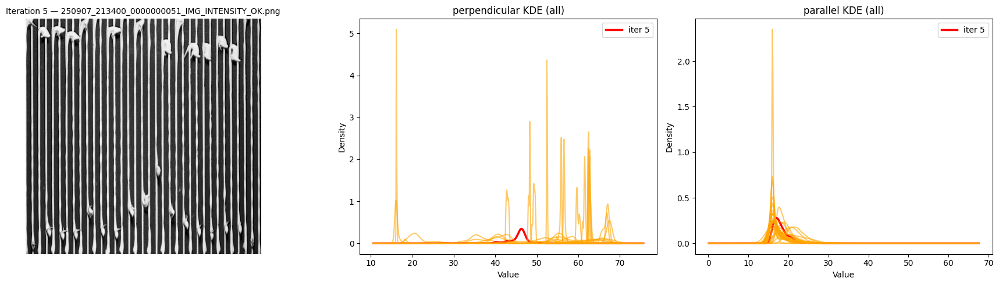

iter 6 : score : 0.209 (perpendicular profile mean : 16.371, parallel profile mean : 16.162)


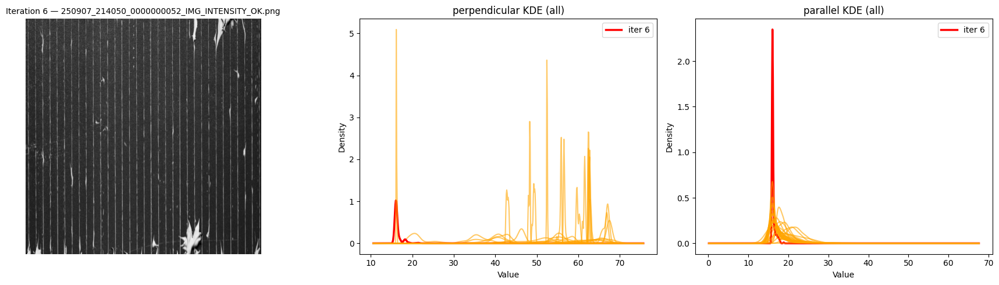

iter 7 : score : 31.703 (perpendicular profile mean : 48.232, parallel profile mean : 16.529)


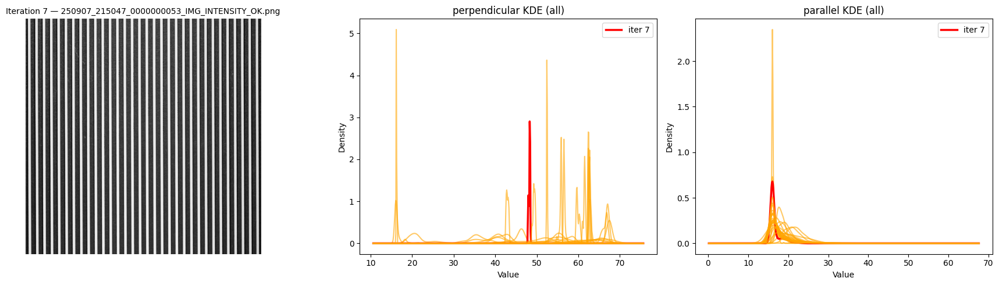

iter 8 : score : 32.819 (perpendicular profile mean : 49.348, parallel profile mean : 16.529)


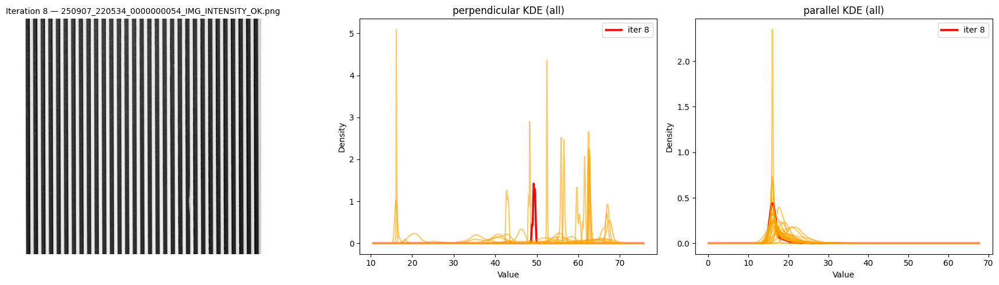

iter 9 : score : 44.216 (perpendicular profile mean : 61.488, parallel profile mean : 17.272)


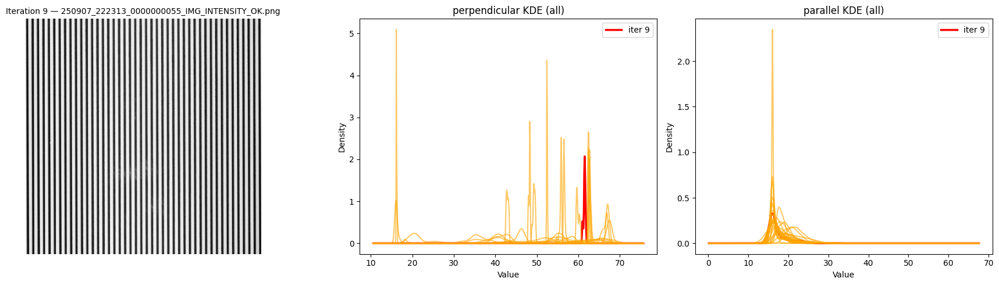

iter 10 : score : 0.181 (perpendicular profile mean : 16.188, parallel profile mean : 16.007)


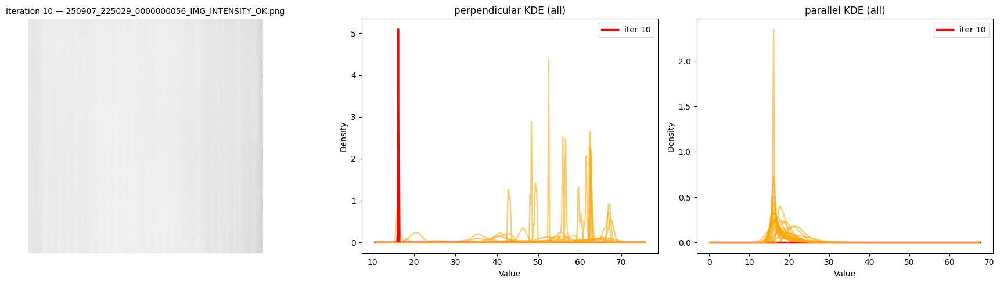

iter 11 : score : 42.907 (perpendicular profile mean : 59.911, parallel profile mean : 17.004)


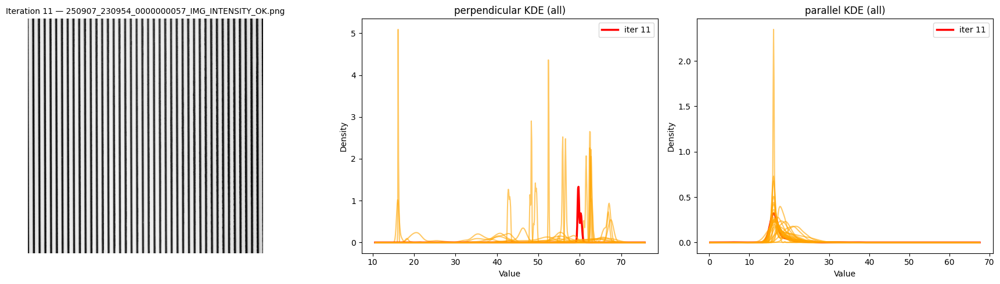

iter 12 : score : 38.875 (perpendicular profile mean : 55.794, parallel profile mean : 16.92)


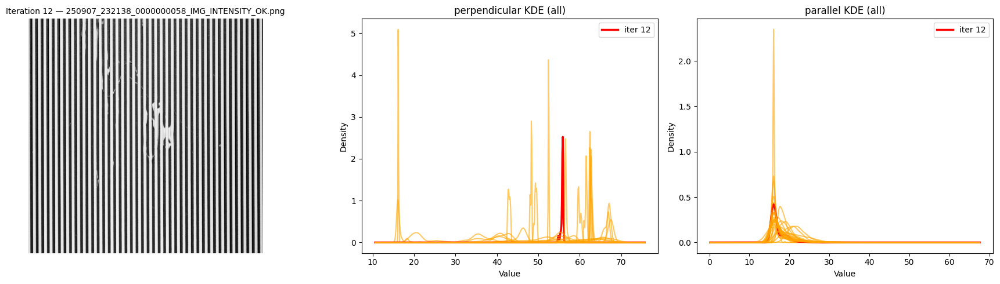

iter 13 : score : 39.019 (perpendicular profile mean : 56.2, parallel profile mean : 17.181)


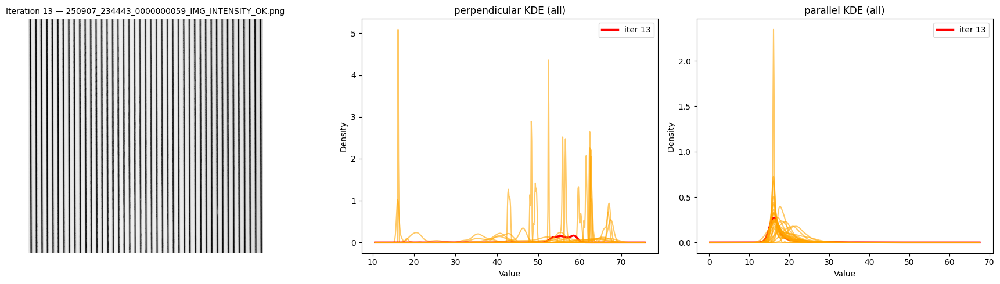

iter 14 : score : 24.486 (perpendicular profile mean : 41.661, parallel profile mean : 17.175)


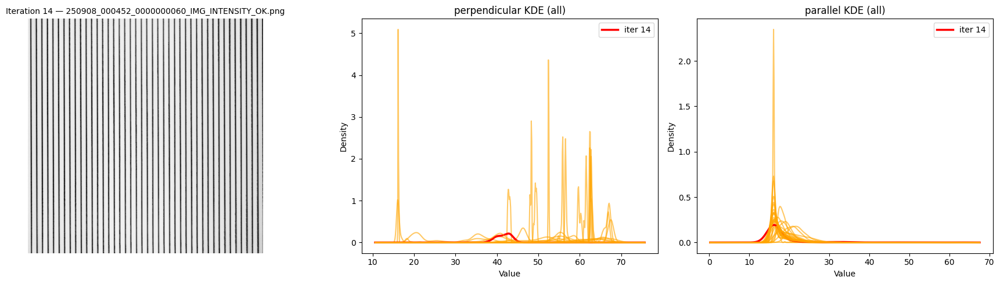

iter 15 : score : 35.817 (perpendicular profile mean : 52.469, parallel profile mean : 16.652)


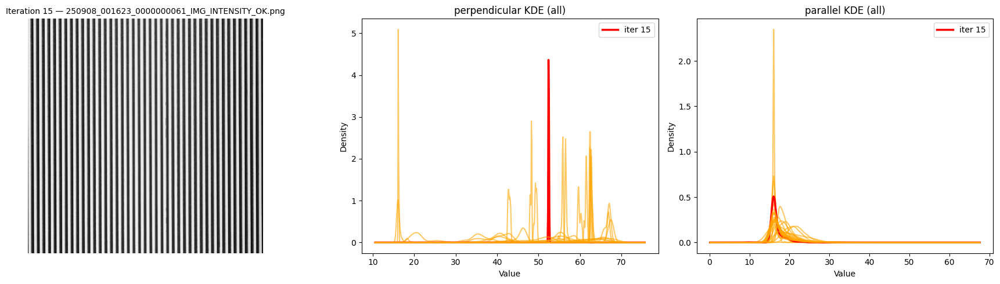

iter 16 : score : 39.723 (perpendicular profile mean : 56.612, parallel profile mean : 16.889)


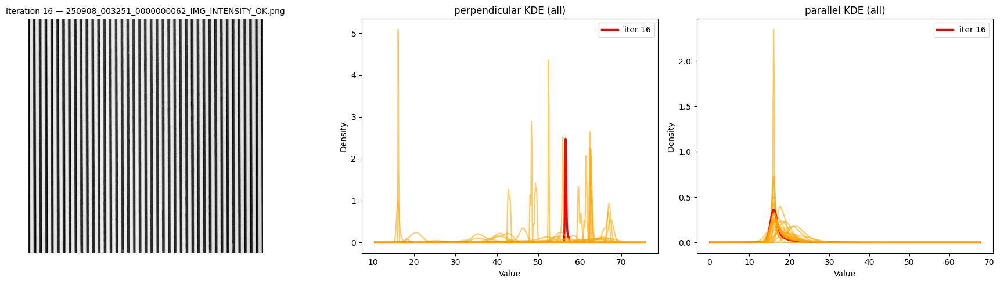

iter 17 : score : 45.213 (perpendicular profile mean : 62.565, parallel profile mean : 17.352)


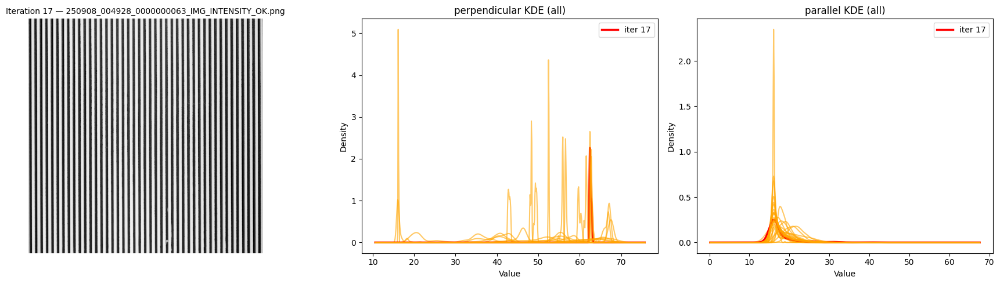

iter 18 : score : 45.458 (perpendicular profile mean : 62.47, parallel profile mean : 17.012)


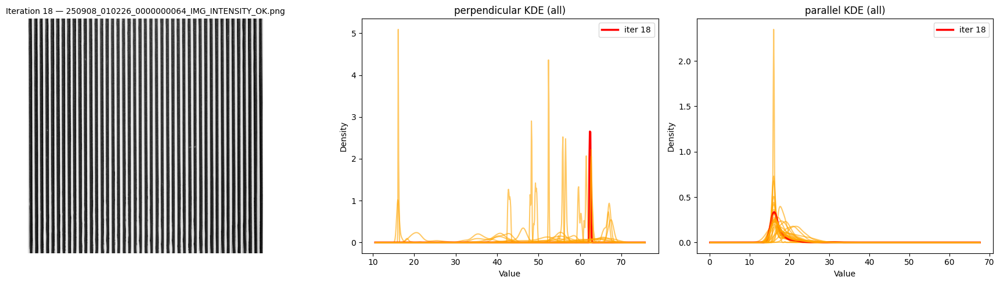

iter 19 : score : 33.749 (perpendicular profile mean : 54.397, parallel profile mean : 20.648)


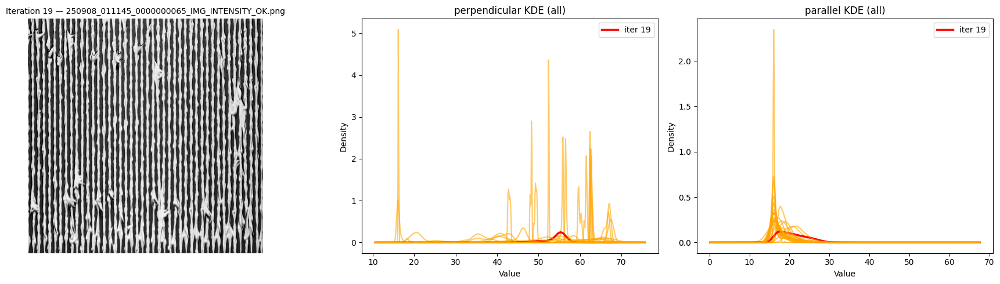

iter 20 : score : 45.649 (perpendicular profile mean : 62.851, parallel profile mean : 17.202)


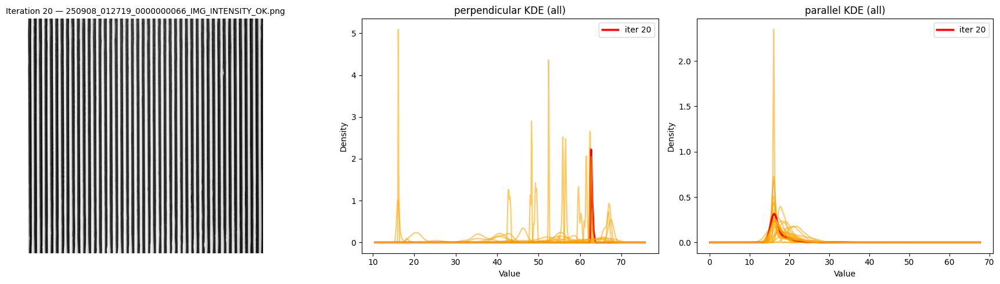

iter 21 : score : 49.332 (perpendicular profile mean : 67.077, parallel profile mean : 17.745)


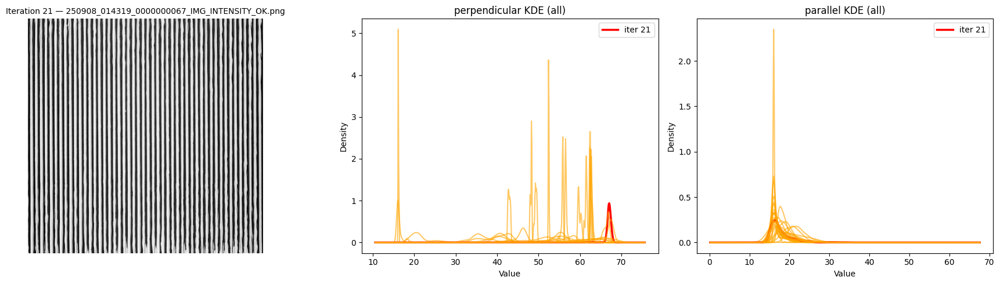

iter 22 : score : 45.077 (perpendicular profile mean : 63.67, parallel profile mean : 18.593)


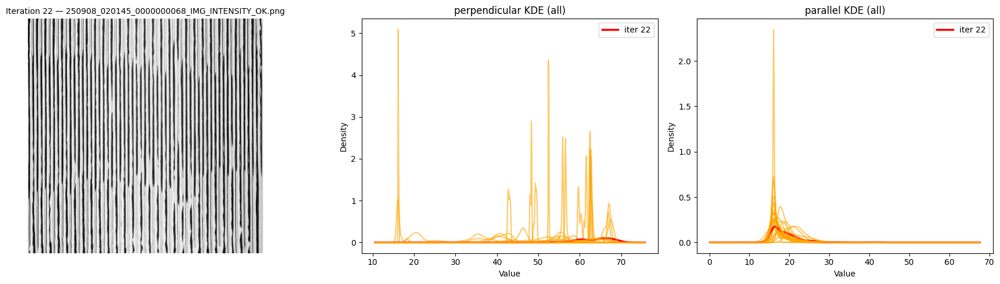

iter 23 : score : 18.278 (perpendicular profile mean : 40.268, parallel profile mean : 21.99)


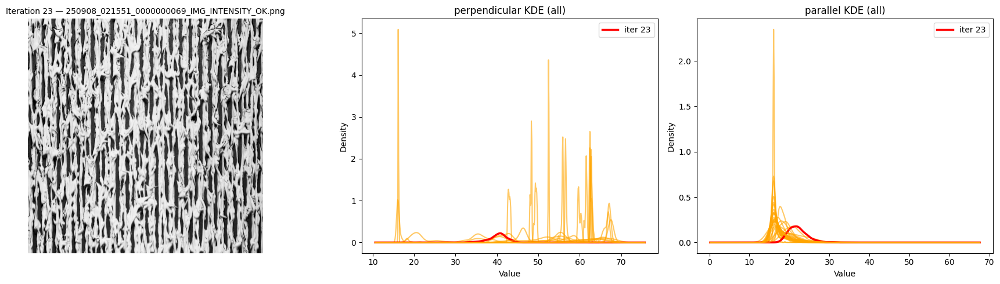

iter 24 : score : 42.133 (perpendicular profile mean : 59.85, parallel profile mean : 17.717)


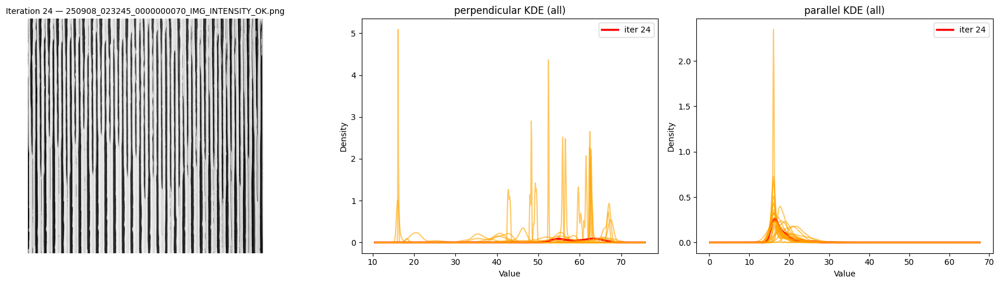

iter 25 : score : 48.878 (perpendicular profile mean : 66.445, parallel profile mean : 17.567)


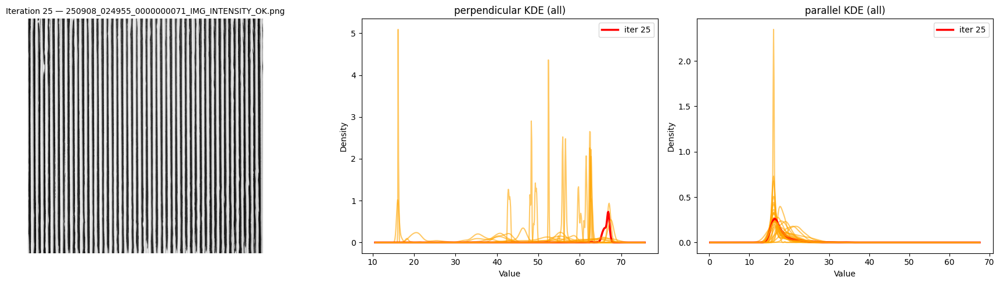

iter 26 : score : 44.872 (perpendicular profile mean : 62.774, parallel profile mean : 17.902)


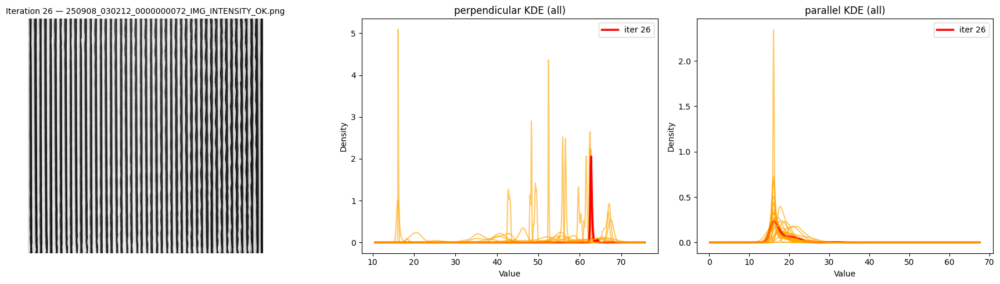

iter 27 : score : 49.772 (perpendicular profile mean : 67.423, parallel profile mean : 17.651)


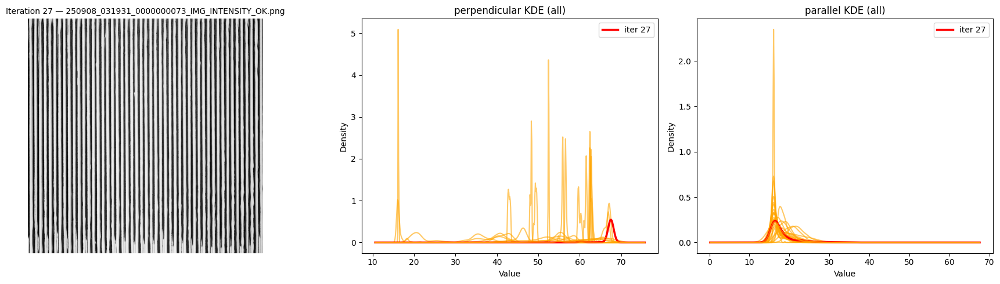

iter 28 : score : 40.452 (perpendicular profile mean : 59.332, parallel profile mean : 18.88)


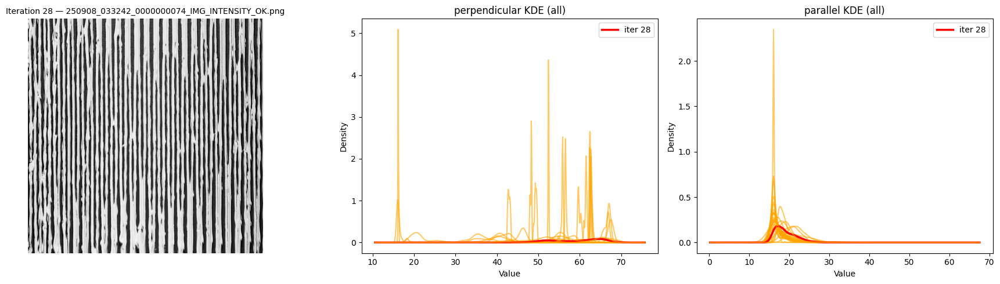

iter 29 : score : 44.228 (perpendicular profile mean : 61.962, parallel profile mean : 17.734)


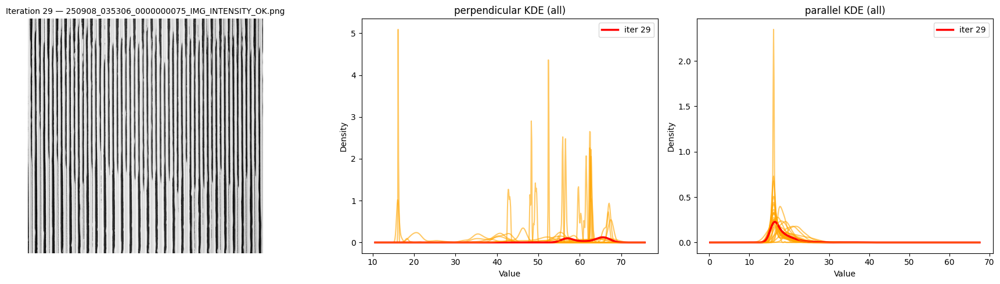

iter 30 : score : 30.384 (perpendicular profile mean : 49.154, parallel profile mean : 18.77)


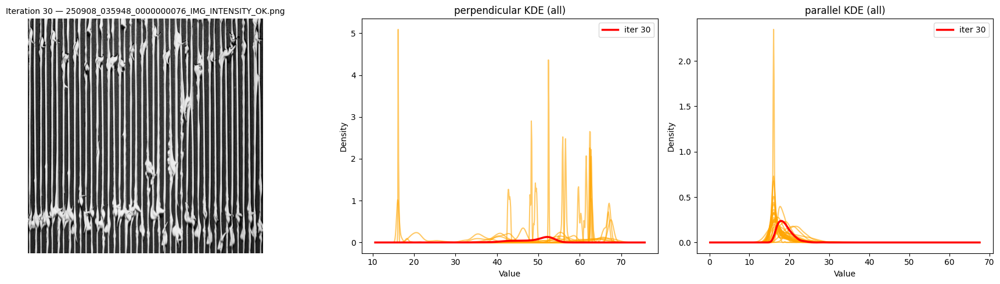

In [37]:

for i in range(30):
    #print(f"iteration {i+1}")
    show_iter_overlay(
        file_path=r"C:250829_104449_last60.txt",
        iter2path=iter2path,
        target_iter=i+1,     
        num_iters=30       
    )
    i += 1
